### Notebook for the GRN inference on Healthy - IAV using `cellroacle`

- **Developed by**: Carlos Talavera-López Ph.D
- **Institute of Computational Biology - Computational Health Centre - Helmholtz Munich**
- v230622

### Import required libraries

In [70]:
import os
import sys

import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

import celloracle as co
co.__version__

'0.12.0'

In [22]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.3
-----
Bio                 1.81
PIL                 9.2.0
appdirs             1.4.4
appnope             0.1.3
asttokens           NA
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
biothings_client    0.3.0
brotli              NA
celloracle          0.12.0
certifi             2022.12.07
cffi                1.15.1
charset_normalizer  2.1.1
colorama            0.4.6
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.6
decorator           5.1.1
defusedxml          0.7.1
diskcache           5.4.0
executing           1.2.0
filelock            3.10.2
genomepy            0.15.0
gimmemotifs         0.17.0
goatools            1.3.1
google              NA
h5py                3.8.0
hypergeom_ufunc     NA
idna                3.4
igraph              0.10.4
invgauss_ufunc      NA
ipykernel           6.22.0
ipython_genutils    0.2.0
ipywidgets          8.0.5
iter

In [2]:
save_folder = "figures"
os.makedirs(save_folder, exist_ok = True)

- Set up working environment

In [3]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
plt.rcParams['figure.figsize'] = (15,7)
plt.rcParams["savefig.dpi"] = 600

### Load datasets

In [4]:
BrEpit_mixed = sc.read_h5ad('../../../data/Epithelial_Mixed_ctl230608_states.raw.h5ad') 
BrEpit_mixed

AnnData object with n_obs × n_vars = 12256 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2', 'mixed_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', '

In [5]:
print(f"Cell number is :{BrEpit_mixed.shape[0]}")
print(f"Gene number is :{BrEpit_mixed.shape[1]}")

Cell number is :12256
Gene number is :27208


### Subset condition of interest

In [26]:
BrEpit_mixed.obs['group'].value_counts()

copd_iav        6164
healthy_iav     4104
copd_ctrl       1271
healthy_ctrl     717
Name: group, dtype: int64

In [8]:
adata = BrEpit_mixed[BrEpit_mixed.obs['group'].isin(['healthy_iav'])]
adata

View of AnnData object with n_obs × n_vars = 4104 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2', 'mixed_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts

In [85]:
adata_log = anndata.AnnData(X = adata.X,  var = adata.var, obs = adata.obs)
sc.pp.normalize_total(adata_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_log)
adata_log.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(adata_log, inplace = False)["X"])

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['ACTB', 'ACTG1', 'AGR2', 'AQP3', 'BPIFA1', 'BPIFB1', 'CTSB', 'CXCL10', 'CXCL11', 'CXCL8', 'HSPA5', 'HSPB1', 'IFI6', 'IFIT2', 'ISG15', 'KRT17', 'KRT4', 'KRT5', 'KRT6A', 'LAMC2', 'LCN2', 'MALAT1', 'MMP13', 'MMP7', 'MSMB', 'MT2A', 'MTRNR2L12', 'MTRNR2L8', 'NC_026431.1', 'NC_026432.1', 'NC_026433.1', 'NC_026434.1', 'NC_026435.1', 'NC_026436.1', 'NC_026437.1', 'NC_026438.1', 'PSCA', 'S100A2', 'SAA1', 'SAA2', 'SCGB1A1', 'SCGB3A1', 'SERPINB3', 'SERPINE1', 'SLPI', 'WFDC2']
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)


In [9]:
print(f"Cell number is :{adata.shape[0]}")
print(f"Gene number is :{adata.shape[1]}")

Cell number is :4104
Gene number is :27208


In [10]:
print(f"Cell number is :{adata.shape[0]}")

Cell number is :4104


### Reduce the inference workload by select HVGs

In [11]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 3000,
    layer = "counts",
    batch_key = "donor",
    subset = True
)

adata

AnnData object with n_obs × n_vars = 4104 × 3000
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2', 'mixed_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_

### Load base GRN

In [12]:
peaks = pd.read_parquet("Epithelial_lung_base_GRN_dataframe.parquet")
peaks.head()

,peak_id,gene_short_name,9430076C15Rik,AC002126.6,AC012531.1,AC226150.2,AFP,AHR,AHRR,AIRE,...,Znf431,Zscan10,Zscan26,Zscan4,arnt,cMyc,cebpa,nMyc,p53,p63
0,chr10_100346875_100347053,SCD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_100346947_100347161,SCD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,chr10_100347087_100347438,SCD,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,chr10_100372680_100372946,OLMALINC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_101130776_101130905,TLX1NB,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Make Oracle object

In [13]:
oracle = co.Oracle()

In [14]:
print("Metadata columns :", list(adata.obs.columns))
print("Dimensional reduction: ", list(adata.obsm.keys()))

Metadata columns : ['sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states', 'seed_labels', 'Viral_score', 'C_scANVI_v2', 'mixed_states']
Dimensional reduction:  ['X_pca', 'X_scANVI', 'X_scVI', 'X_umap']


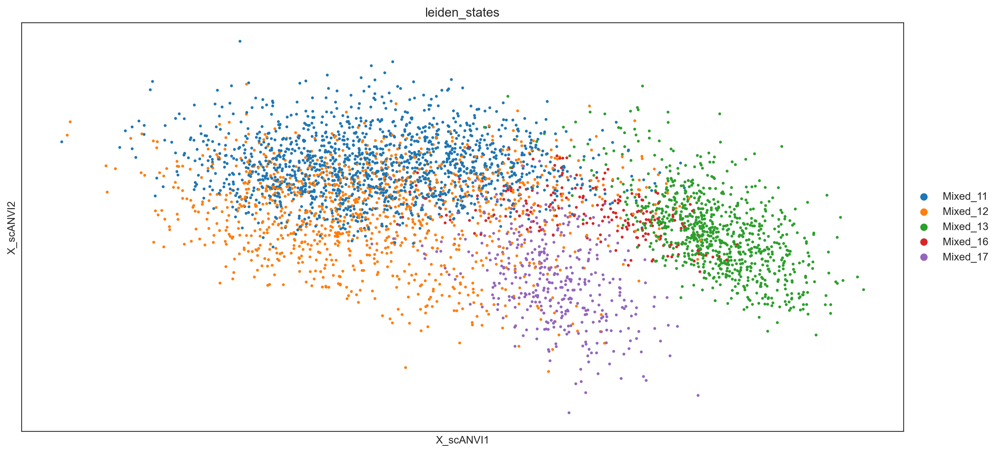

In [15]:
oracle.import_anndata_as_raw_count(adata = adata,
                                   cluster_column_name = "leiden_states",
                                   embedding_name = "X_scANVI")

In [16]:
oracle.import_TF_data(TF_info_matrix = peaks)

### KNN imputation

In [17]:
oracle.perform_PCA()

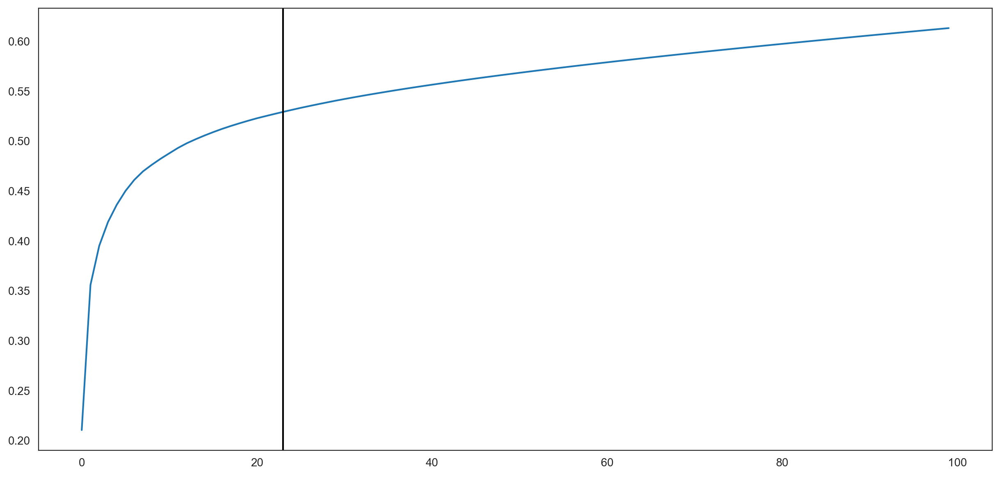

23


In [18]:
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c = "k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

- Estimate the optimal number of nearest neighbors for KNN imputation.

In [19]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :4104


In [20]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

Auto-selected k is :102


In [21]:
oracle.knn_imputation(n_pca_dims = n_comps, k = k, balanced = True, b_sight = k*8,
                      b_maxl = k*4, n_jobs = 4)

-  Save and Load

### GRN calculation

In [80]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.3
-----
Bio                 1.81
PIL                 9.2.0
appdirs             1.4.4
appnope             0.1.3
asttokens           NA
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
biothings_client    0.3.0
brotli              NA
celloracle          0.12.0
certifi             2022.12.07
cffi                1.15.1
charset_normalizer  2.1.1
colorama            0.4.6
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.6
decorator           5.1.1
defusedxml          0.7.1
diskcache           5.4.0
executing           1.2.0
filelock            3.10.2
genomepy            0.15.0
gimmemotifs         0.17.0
goatools            1.3.1
google              NA
h5py                3.8.0
hypergeom_ufunc     NA
idna                3.4
igraph              0.10.4
invgauss_ufunc      NA
ipykernel           6.22.0
ipython_genutils    0.2.0
ipywidgets          8.0.5
iter

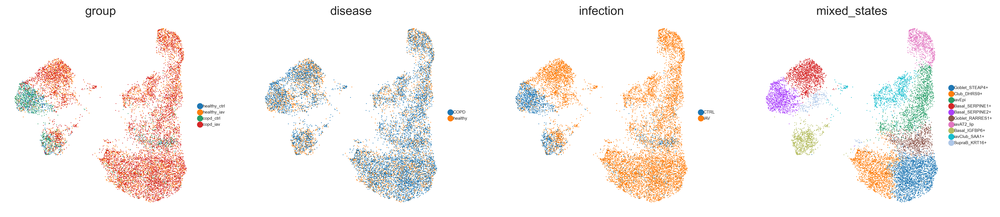

In [29]:
sc.pl.umap(BrEpit_mixed, frameon = False, color = ['group', 'disease', 'infection', 'mixed_states'], size = 3, legend_fontsize = 5, ncols = 4)

In [30]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = (15,7)
plt.rcParams["savefig.dpi"] = 600

In [37]:
%%time
links = oracle.get_links(cluster_name_for_GRN_unit = "mixed_states", alpha = 10,
                         verbose_level = 10)

  0%|          | 0/10 [00:00<?, ?it/s]

Inferring GRN for Basal_IGFBP6+...


  0%|          | 0/492 [00:00<?, ?it/s]

Inferring GRN for Basal_SERPINE1+...


  0%|          | 0/492 [00:00<?, ?it/s]

Inferring GRN for Basal_SERPINE2+...


  0%|          | 0/492 [00:00<?, ?it/s]

Inferring GRN for Club_DHRS9+...


  0%|          | 0/492 [00:00<?, ?it/s]

Inferring GRN for Goblet_RARRES1+...


  0%|          | 0/492 [00:00<?, ?it/s]

Inferring GRN for Goblet_STEAP4+...


  0%|          | 0/492 [00:00<?, ?it/s]

Inferring GRN for SupraB_KRT16+...


  0%|          | 0/492 [00:00<?, ?it/s]

Inferring GRN for iavAT2_lip...


  0%|          | 0/492 [00:00<?, ?it/s]

Inferring GRN for iavClub_SAA1+...


  0%|          | 0/492 [00:00<?, ?it/s]

Inferring GRN for iavEpi...


  0%|          | 0/492 [00:00<?, ?it/s]

CPU times: user 1min 37s, sys: 4.34 s, total: 1min 41s
Wall time: 2min 33s


In [38]:
links.links_dict.keys()

dict_keys(['Basal_IGFBP6+', 'Basal_SERPINE1+', 'Basal_SERPINE2+', 'Club_DHRS9+', 'Goblet_RARRES1+', 'Goblet_STEAP4+', 'SupraB_KRT16+', 'iavAT2_lip', 'iavClub_SAA1+', 'iavEpi'])

In [39]:
links.links_dict["Basal_SERPINE2+"]

,source,target,coef_mean,coef_abs,p,-logp
0,ESR1,ABCC5,0.018653,0.018653,3.357718e-08,7.473956
1,POU2F2,ABLIM1,-0.108180,0.108180,2.127143e-09,8.672203
2,BHLHE41,ABLIM1,-0.008836,0.008836,3.484166e-01,0.457901
3,POU2F1,ABLIM1,-0.013610,0.013610,3.603045e-01,0.443330
4,OTX1,ABLIM1,0.131951,0.131951,9.279207e-12,11.032489
...,...,...,...,...,...,...
4893,FOXD4,ZNF391,0.005753,0.005753,9.892773e-05,4.004682
4894,FOXB1,ZNF391,0.022225,0.022225,7.728339e-10,9.111914
4895,AR,ZNF391,0.013113,0.013113,7.348982e-10,9.133773
4896,EHF,ZNF391,0.026307,0.026307,1.495580e-10,9.825190


### Network preprocessing

In [40]:
links.filter_links(p = 0.001, weight = "coef_abs", threshold_number = 2000)

Basal_IGFBP6+


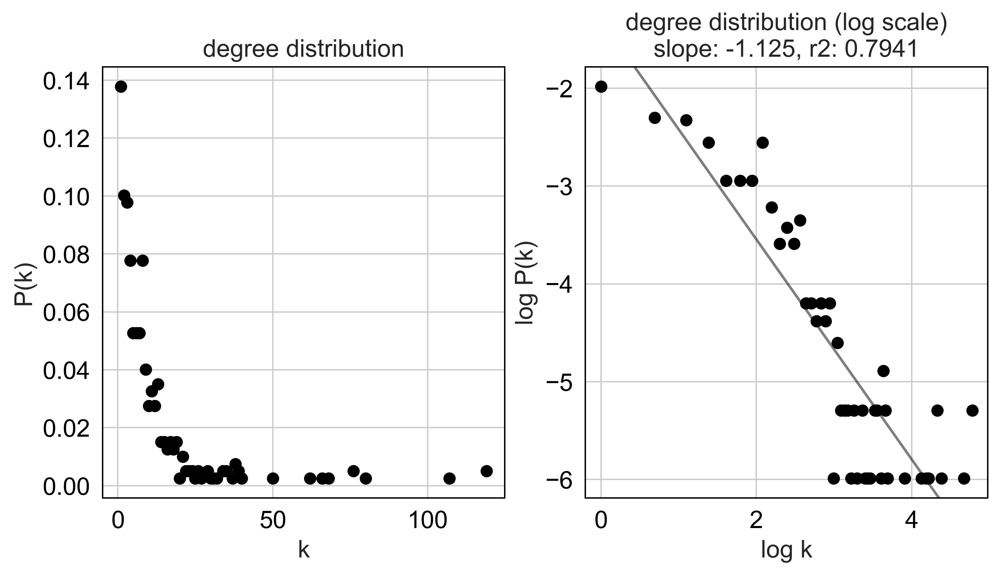

Basal_SERPINE1+


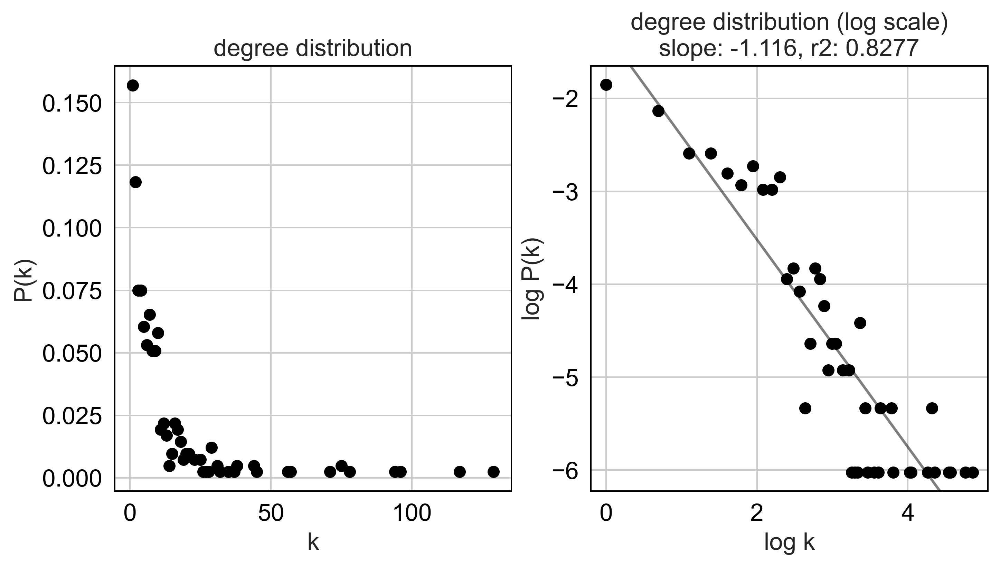

Basal_SERPINE2+


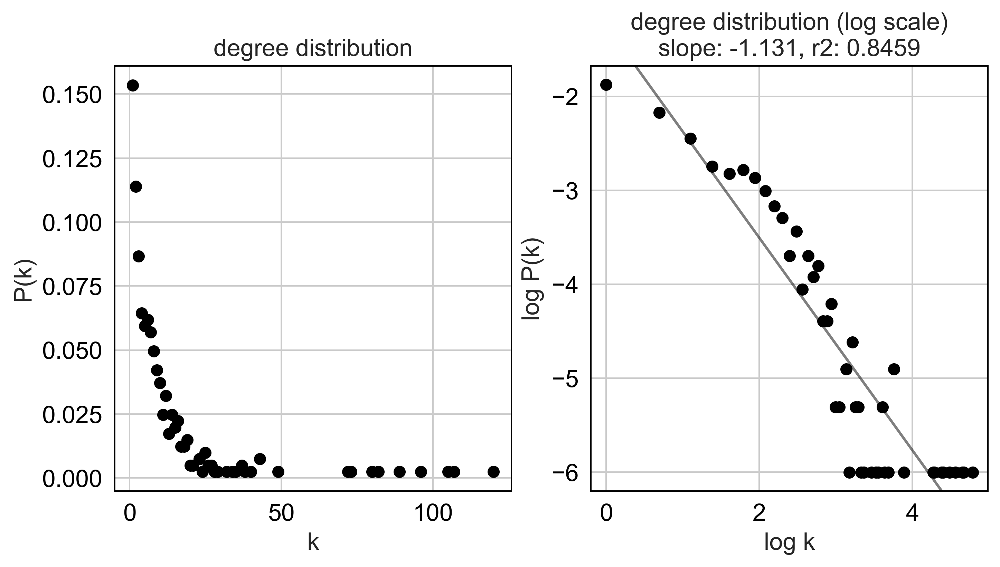

Club_DHRS9+


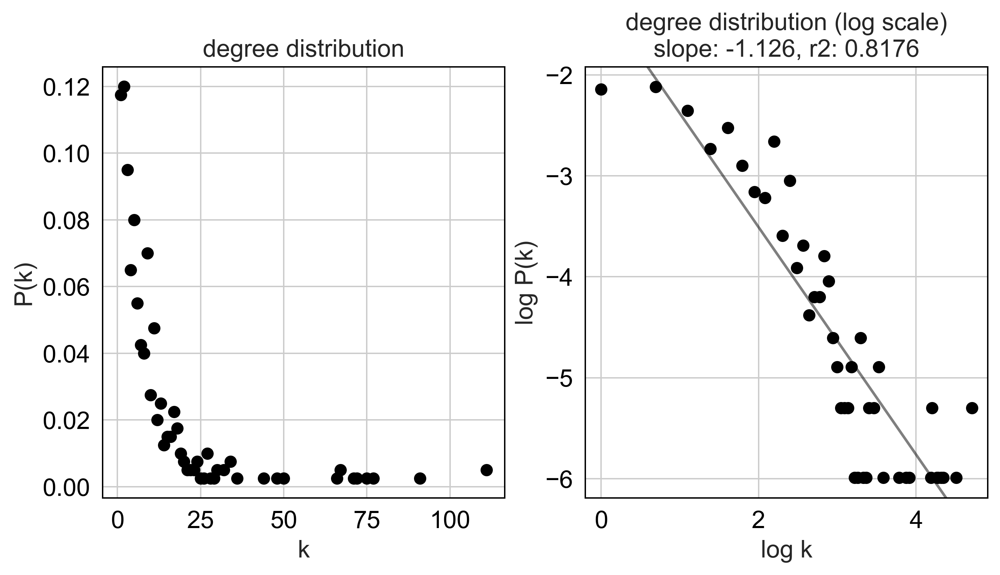

Goblet_RARRES1+


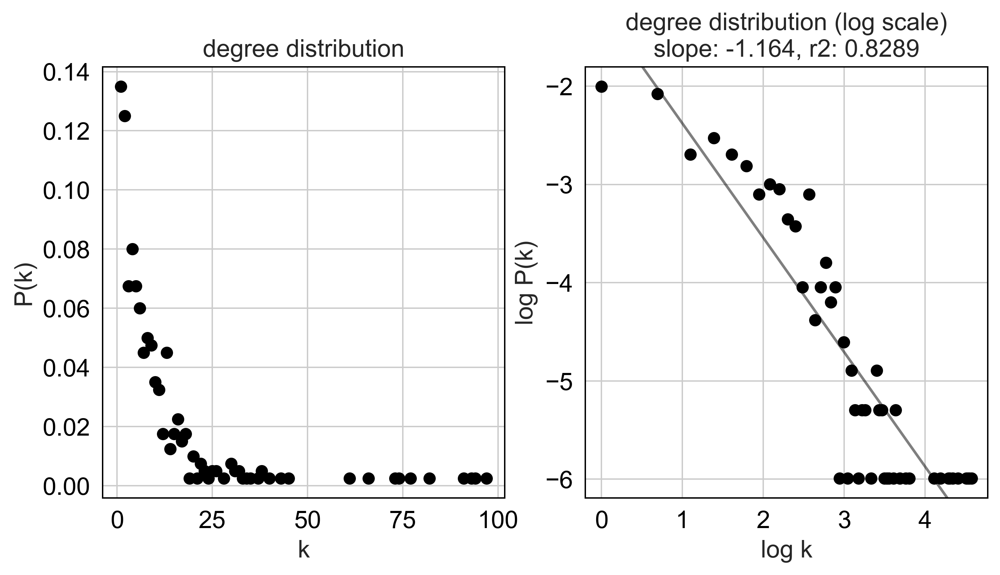

Goblet_STEAP4+


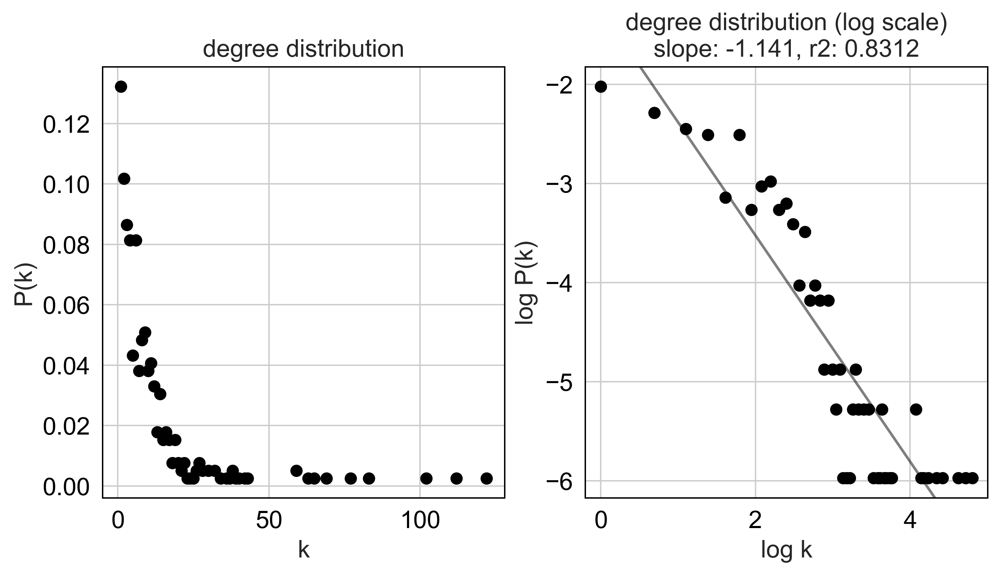

SupraB_KRT16+


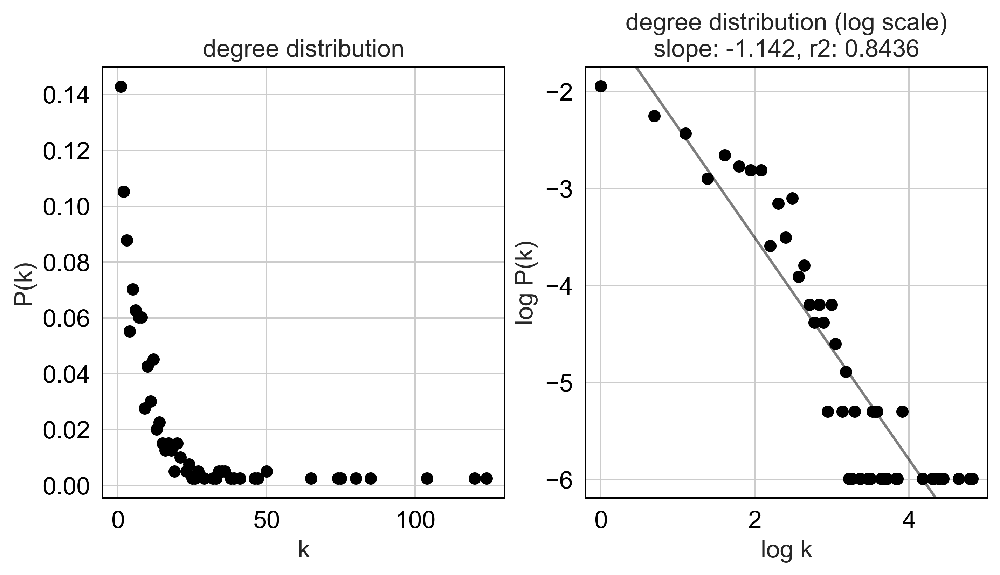

iavAT2_lip


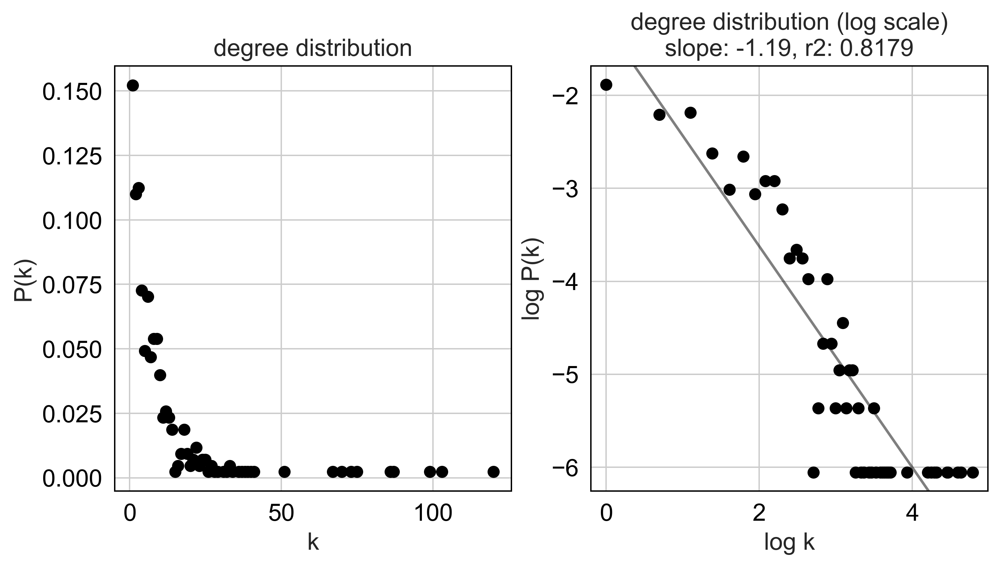

iavClub_SAA1+


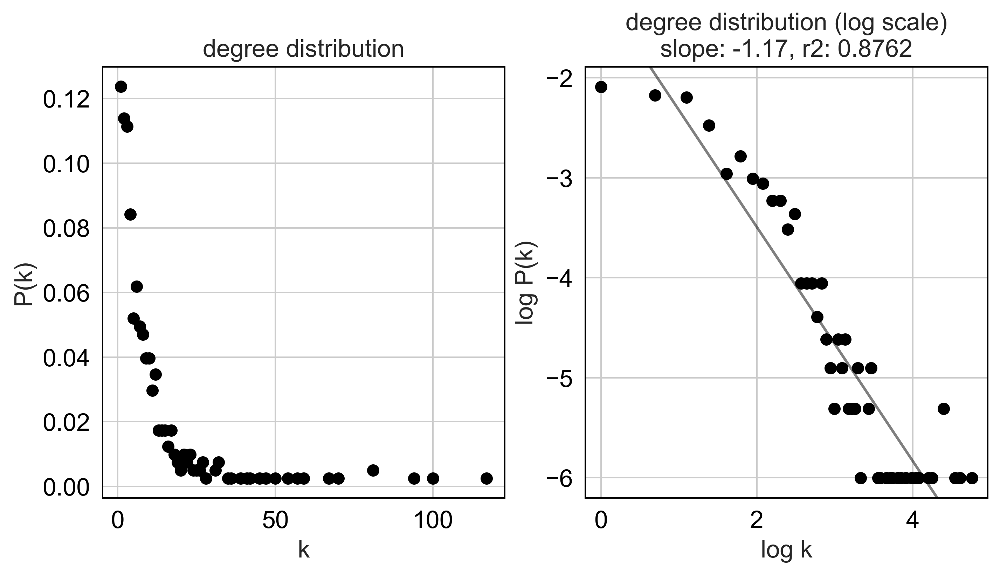

iavEpi


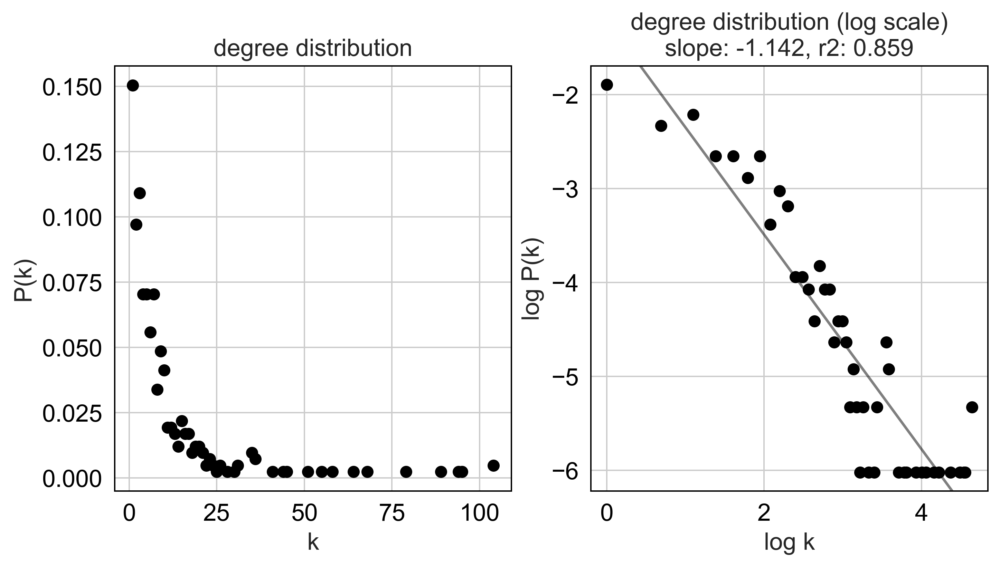

In [41]:
plt.rcParams["figure.figsize"] = [9, 4.5]
links.plot_degree_distributions(plot_model = True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )

### Calculate several network scores

In [42]:
links.get_network_score()
links.merged_score.head()

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
ELF3,17,0.042714,0,0.000000,17,0.042714,0.0,0.175368,Basal_IGFBP6+
KRT17,2,0.005025,2,0.005025,0,0.000000,0.0,0.211122,Basal_IGFBP6+
KLF7,119,0.298995,0,0.000000,119,0.298995,0.0,1.000000,Basal_IGFBP6+
TINAGL1,4,0.010050,4,0.010050,0,0.000000,0.0,0.479487,Basal_IGFBP6+
IRF7,24,0.060302,13,0.032663,11,0.027638,127.0,0.227883,Basal_IGFBP6+


In [43]:
links.cluster

['Basal_IGFBP6+',
 'Basal_SERPINE1+',
 'Basal_SERPINE2+',
 'Club_DHRS9+',
 'Goblet_RARRES1+',
 'Goblet_STEAP4+',
 'SupraB_KRT16+',
 'iavAT2_lip',
 'iavClub_SAA1+',
 'iavEpi']

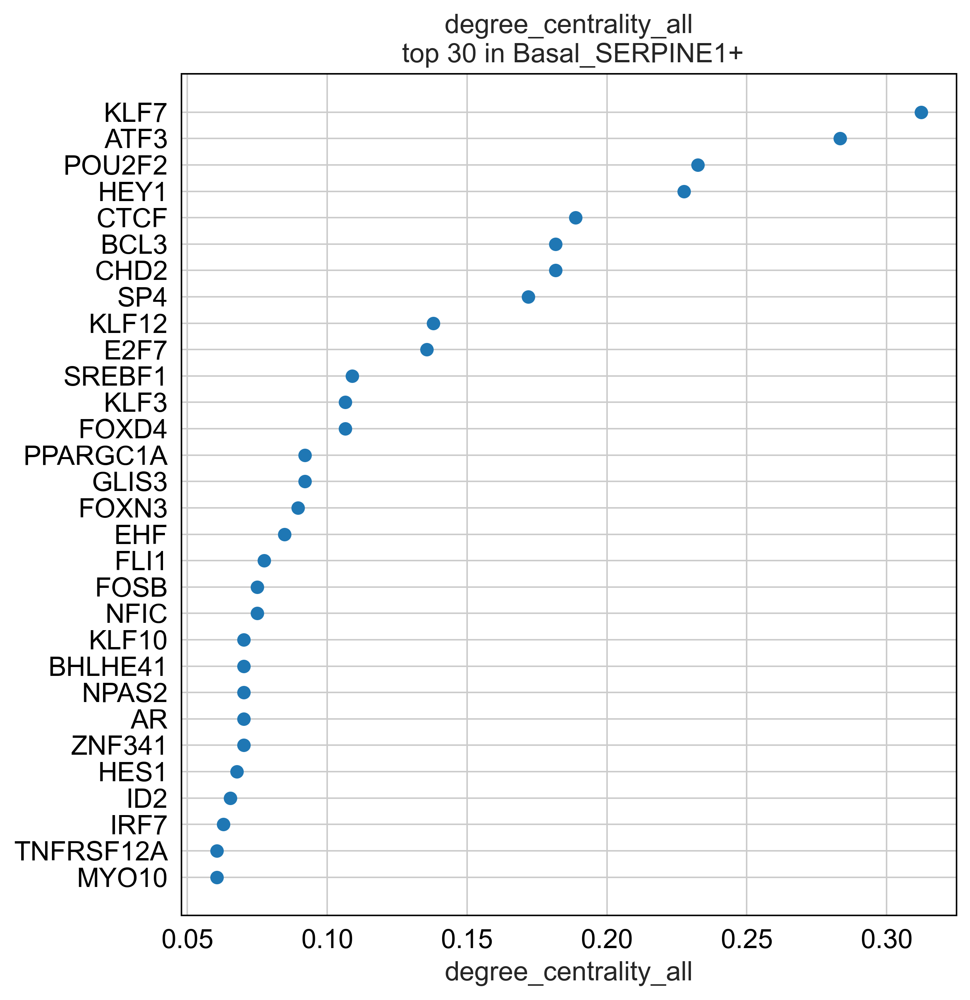

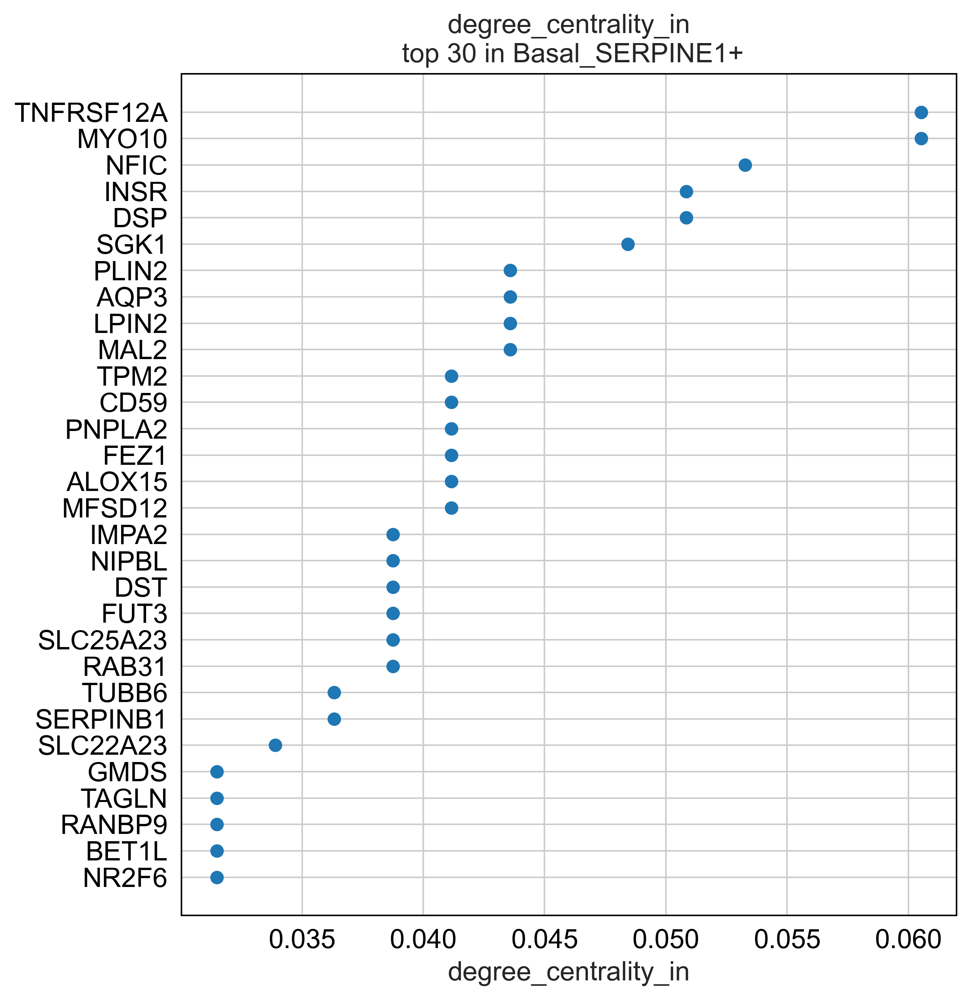

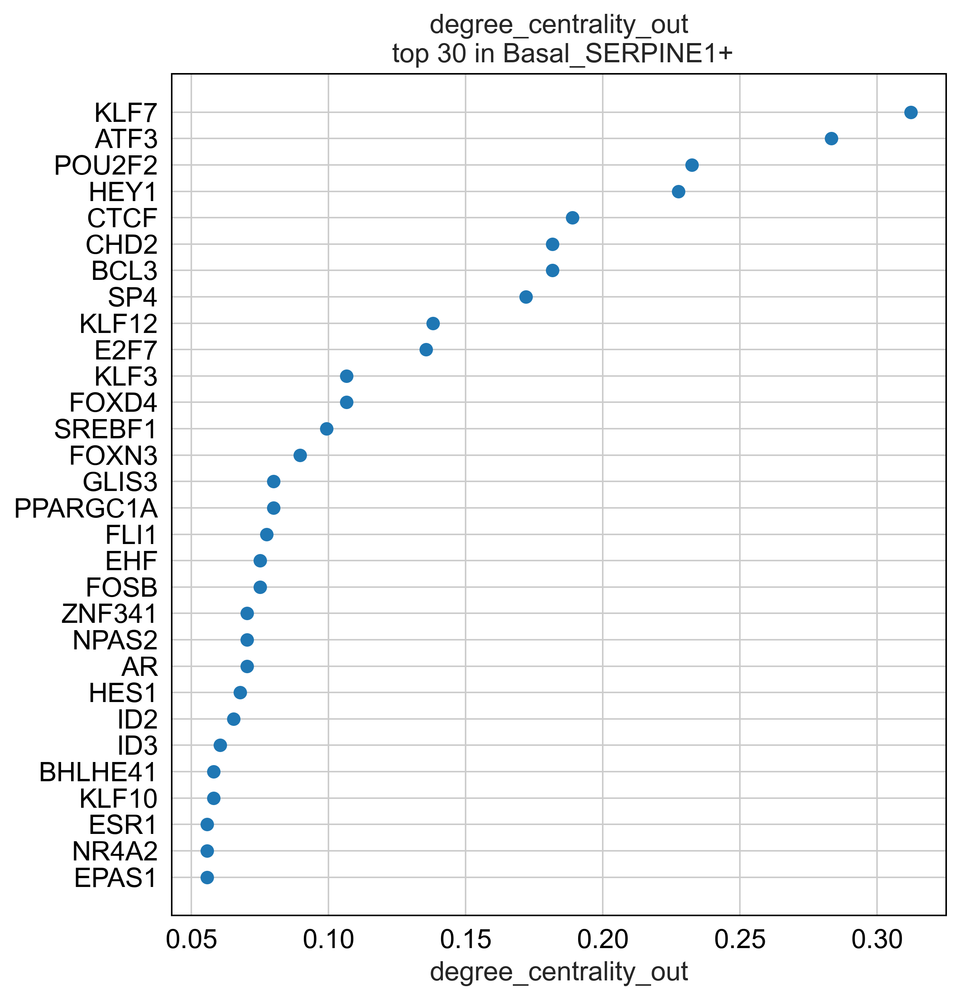

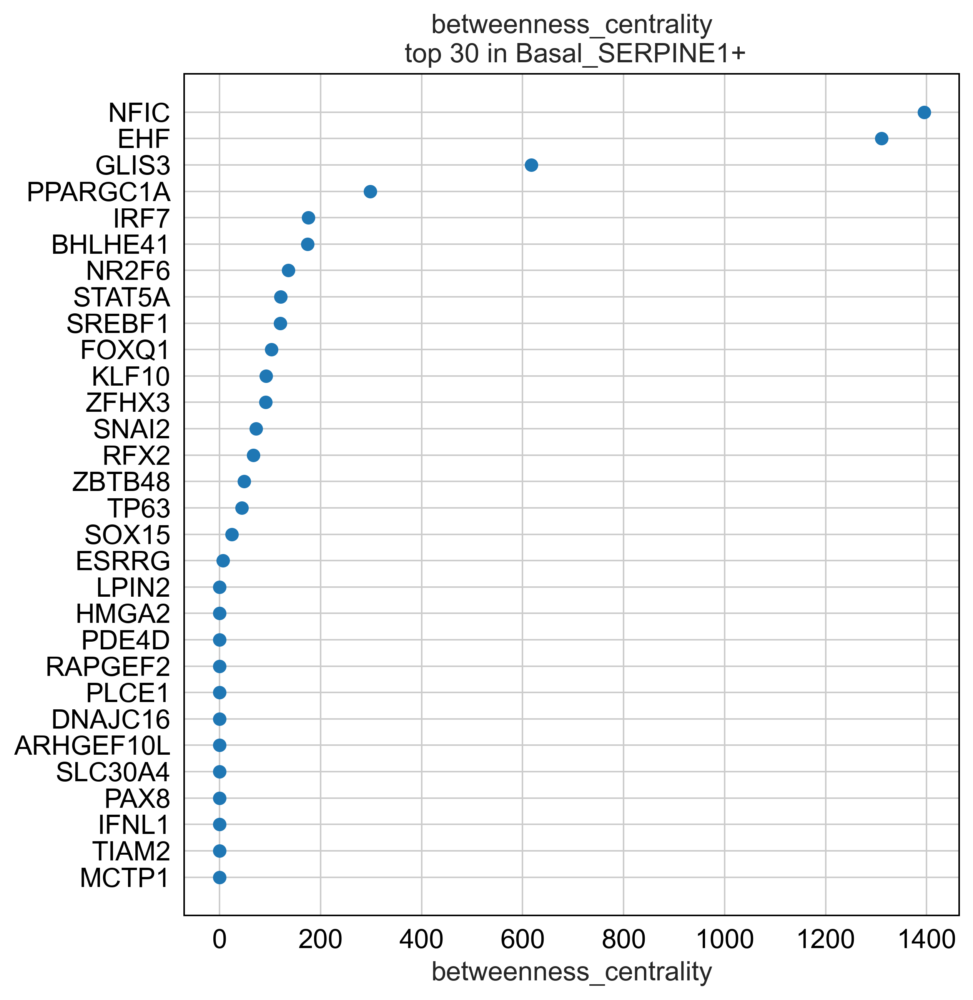

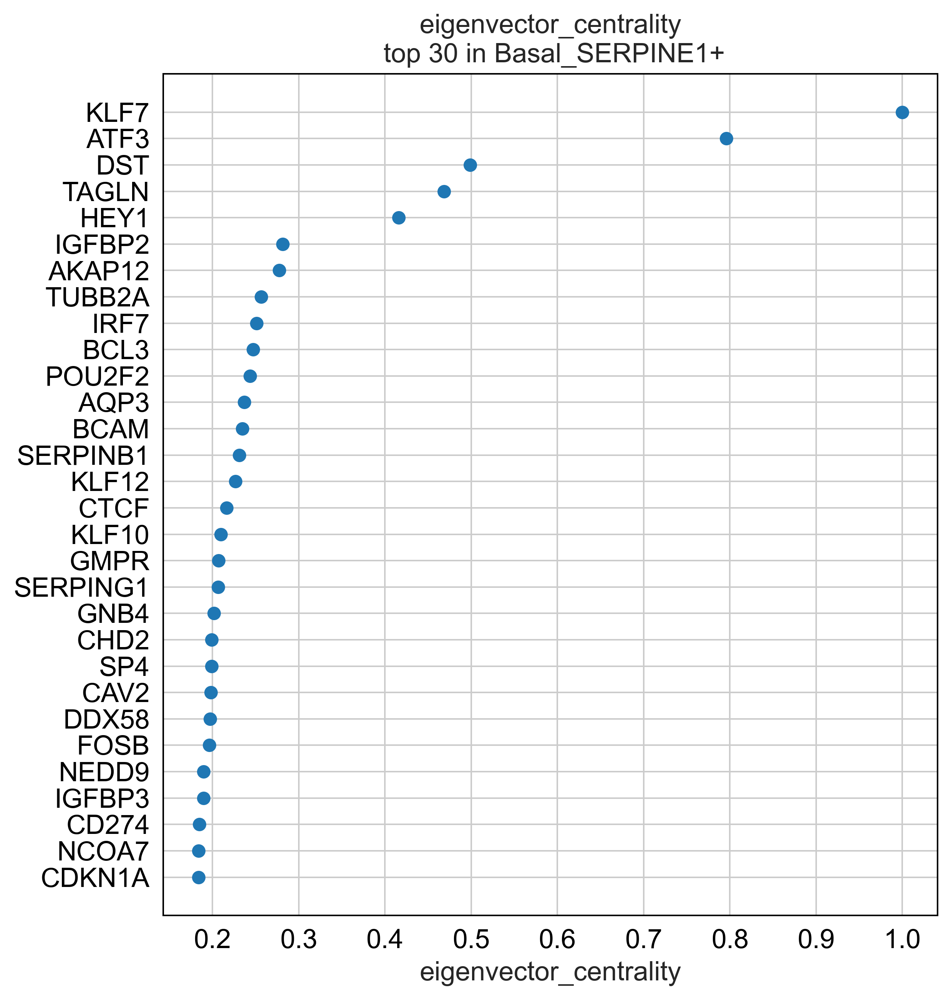

In [44]:
plt.rcParams["figure.figsize"] = [16, 8]
links.plot_scores_as_rank(cluster = "Basal_SERPINE1+", n_gene = 30, save = f"{save_folder}/ranked_score")

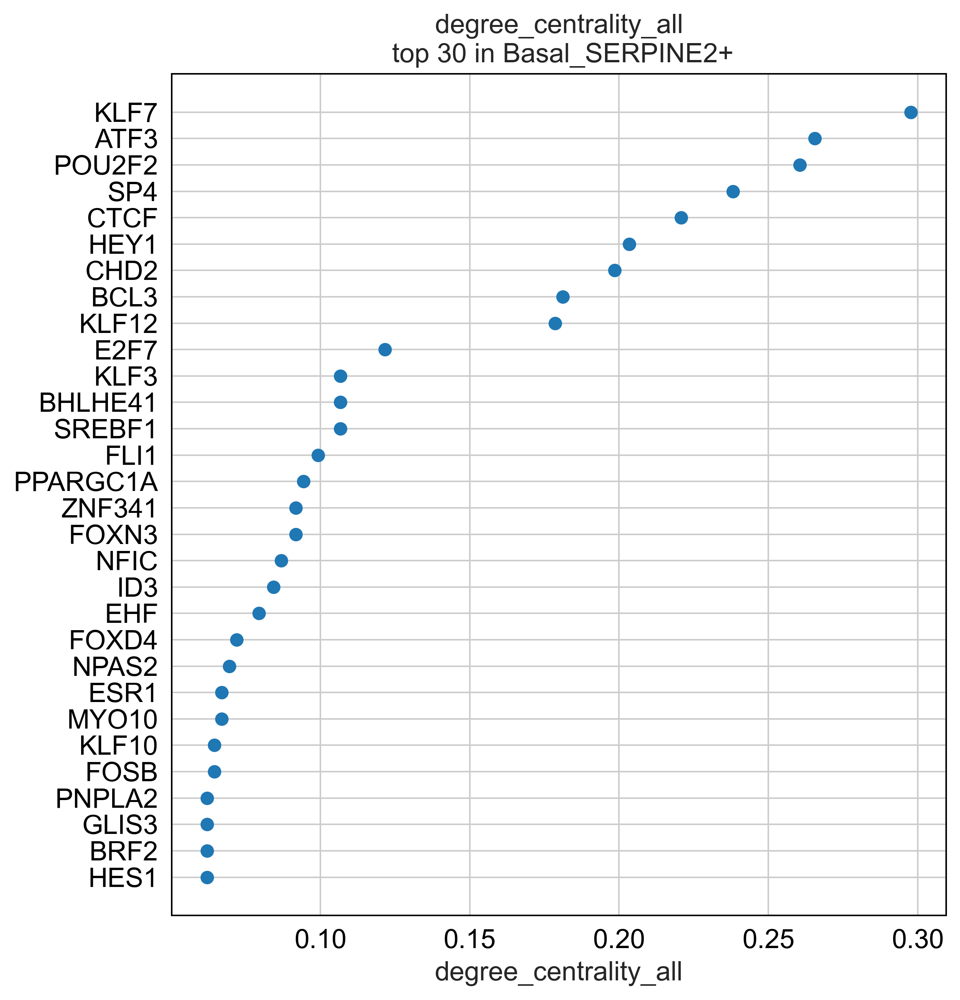

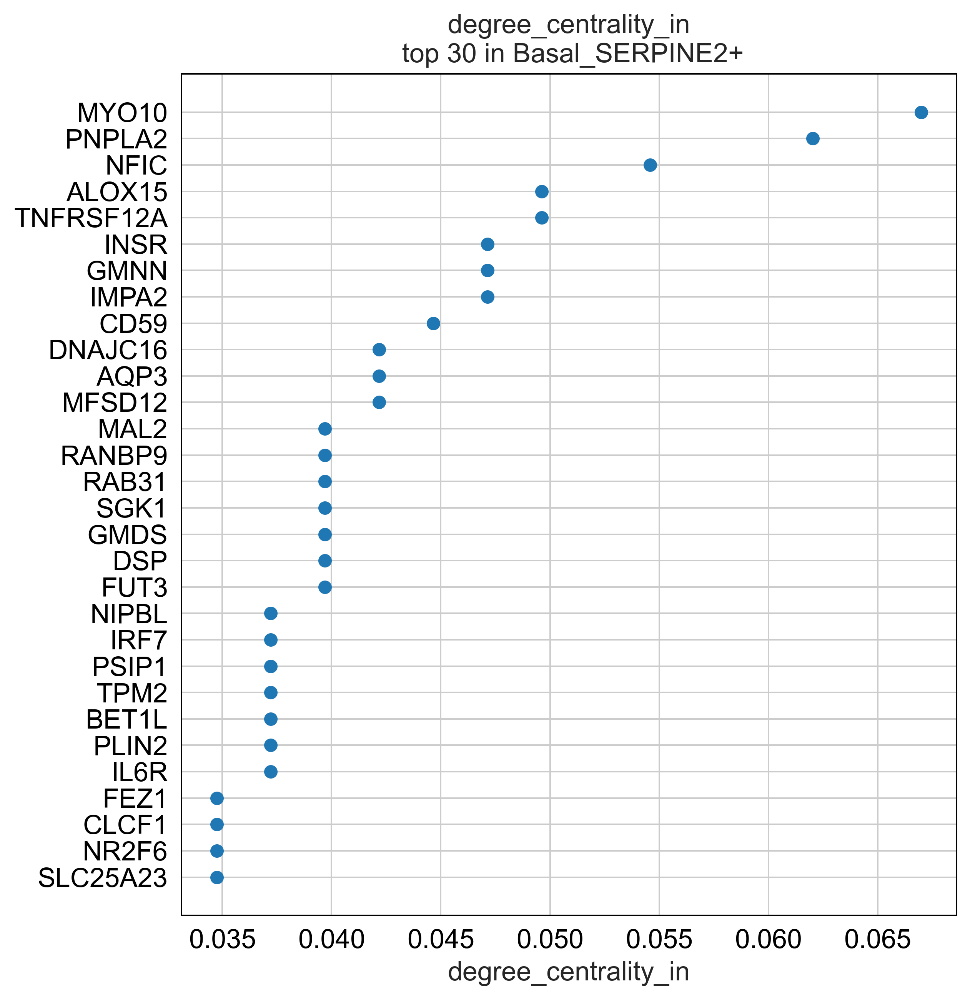

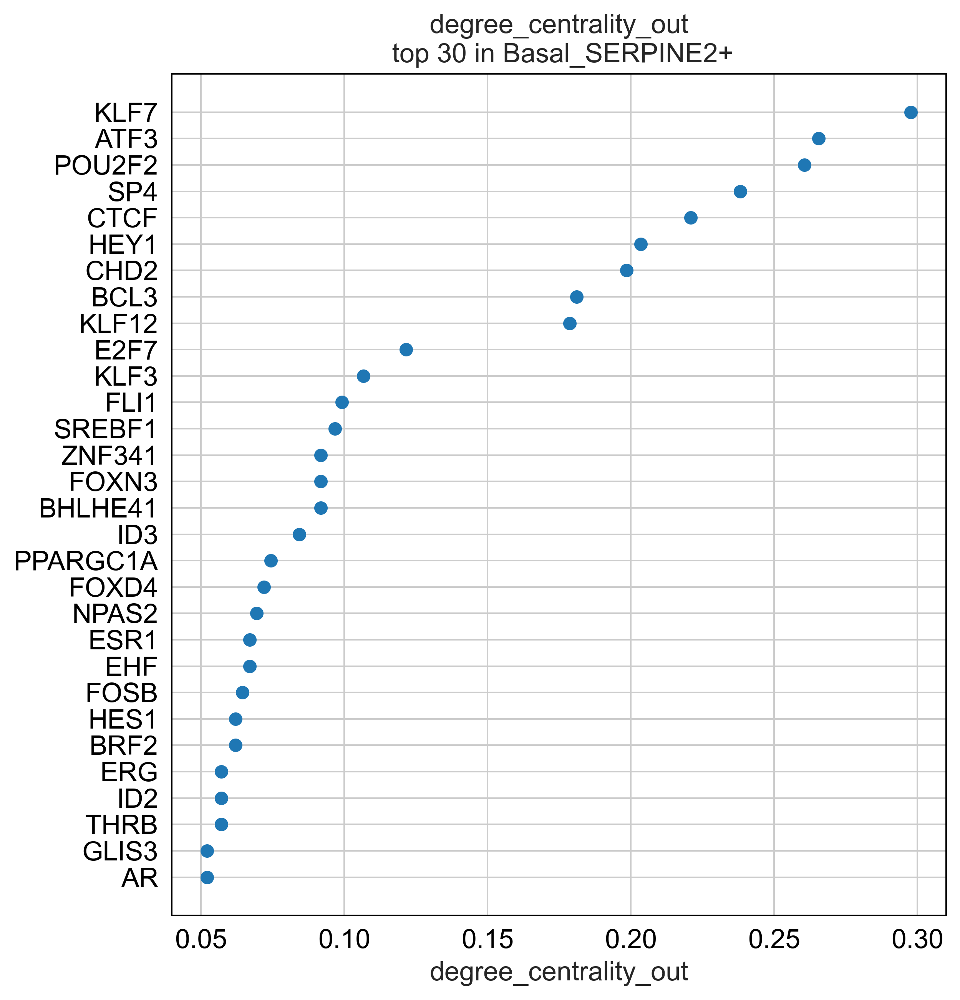

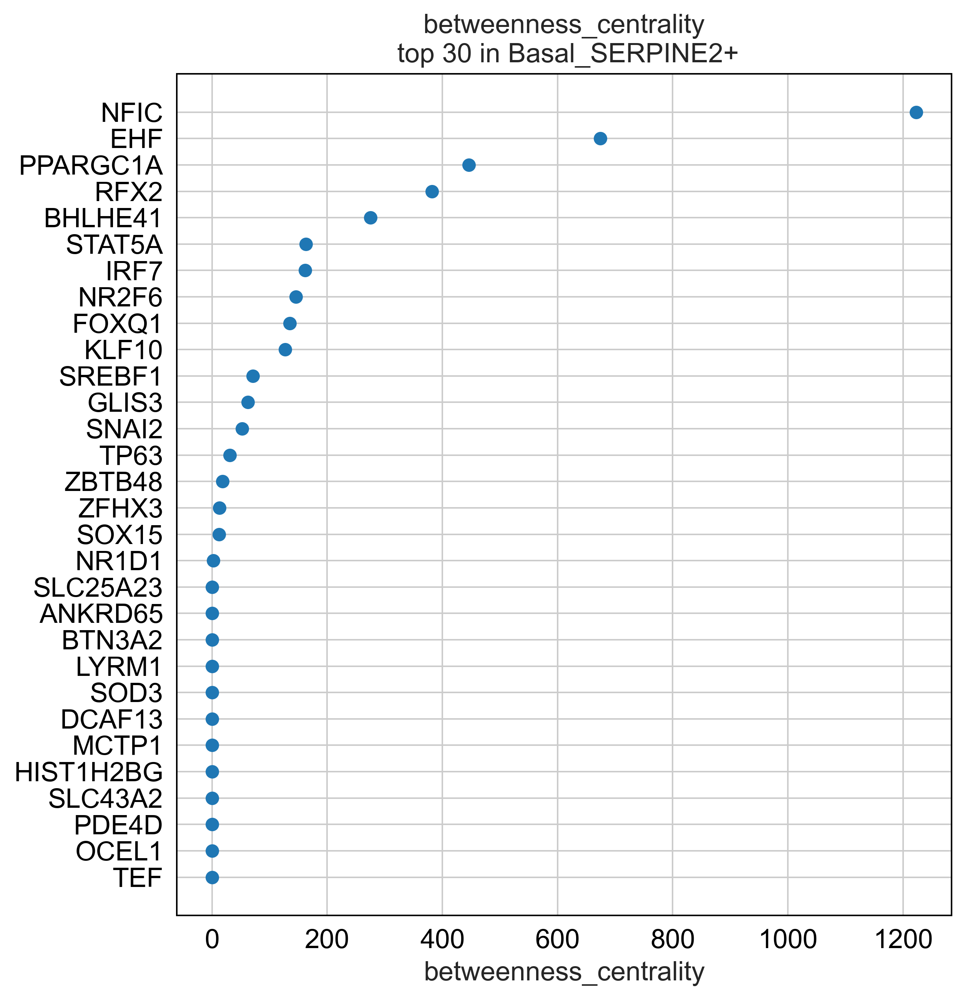

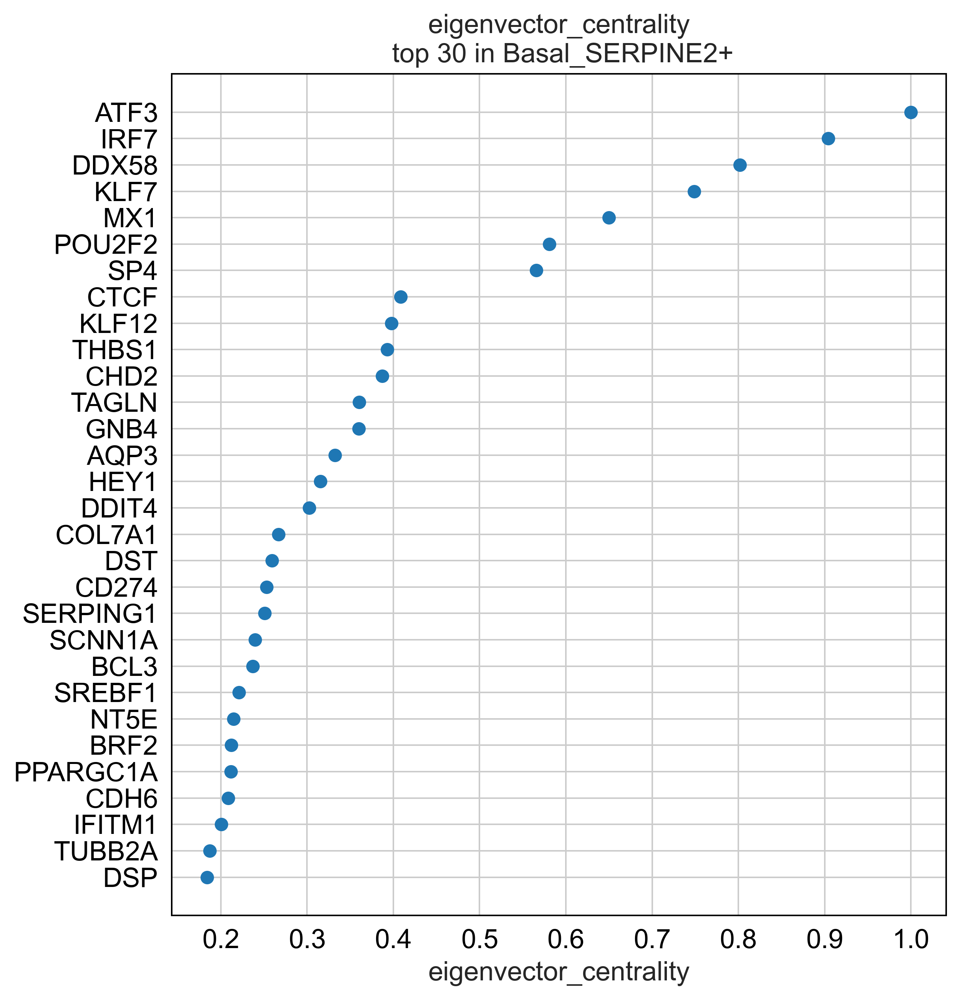

In [45]:
plt.rcParams["figure.figsize"] = [16, 8]
links.plot_scores_as_rank(cluster = "Basal_SERPINE2+", n_gene = 30, save = f"{save_folder}/ranked_score")

### Compare GRN structur between clusters

In [46]:
links.cluster

['Basal_IGFBP6+',
 'Basal_SERPINE1+',
 'Basal_SERPINE2+',
 'Club_DHRS9+',
 'Goblet_RARRES1+',
 'Goblet_STEAP4+',
 'SupraB_KRT16+',
 'iavAT2_lip',
 'iavClub_SAA1+',
 'iavEpi']

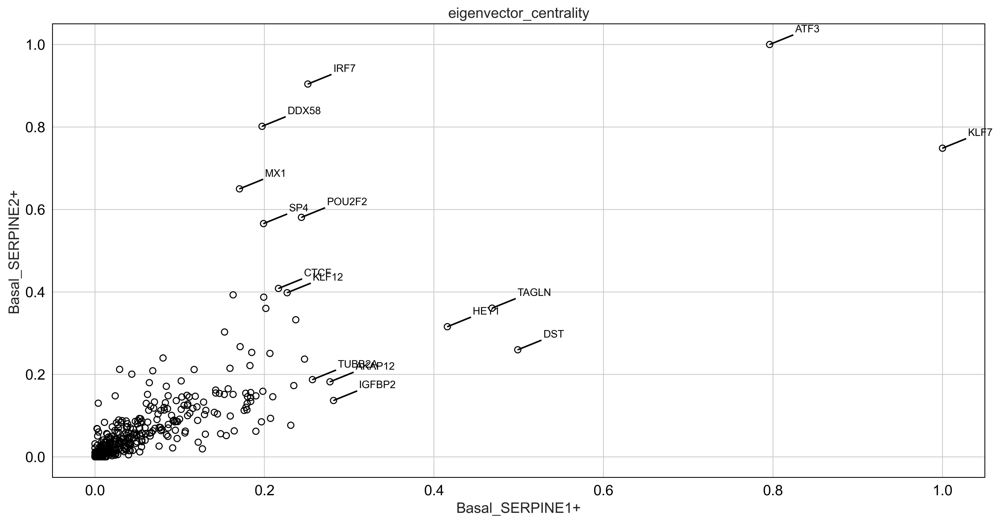

In [47]:
links.plot_score_comparison_2D(value = "eigenvector_centrality",
                               cluster1 = "Basal_SERPINE1+", cluster2 = "Basal_SERPINE2+",
                               percentile = 98,
                               save = f"{save_folder}/score_comparison")

KLF7


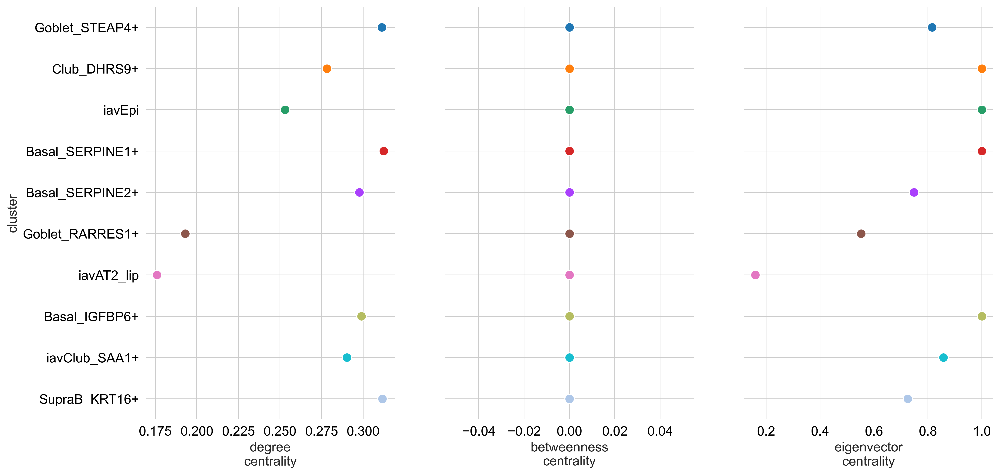

In [48]:
links.plot_score_per_cluster(goi="KLF7")

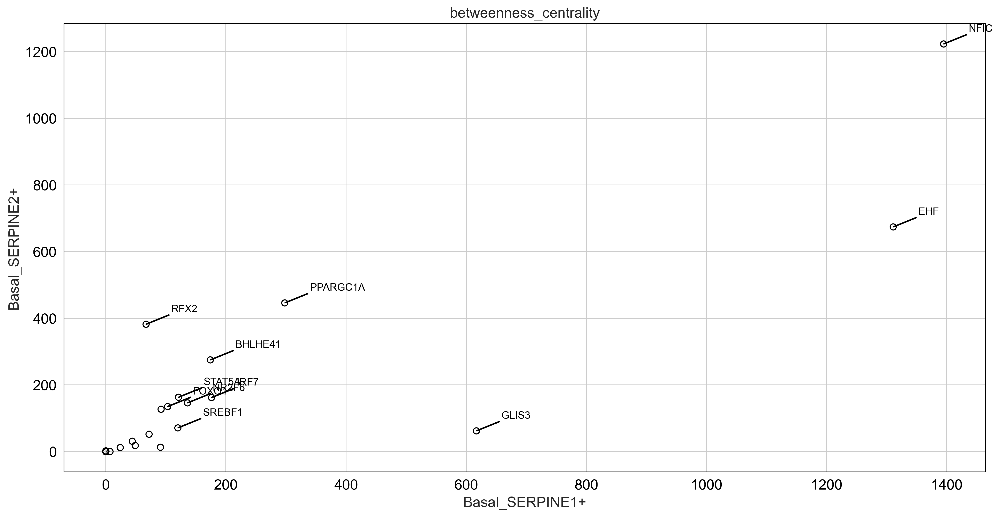

In [49]:
links.plot_score_comparison_2D(value = "betweenness_centrality",
                               cluster1 = "Basal_SERPINE1+", cluster2 = "Basal_SERPINE2+",
                               percentile = 98,
                               save = f"{save_folder}/score_comparison")

NFIC


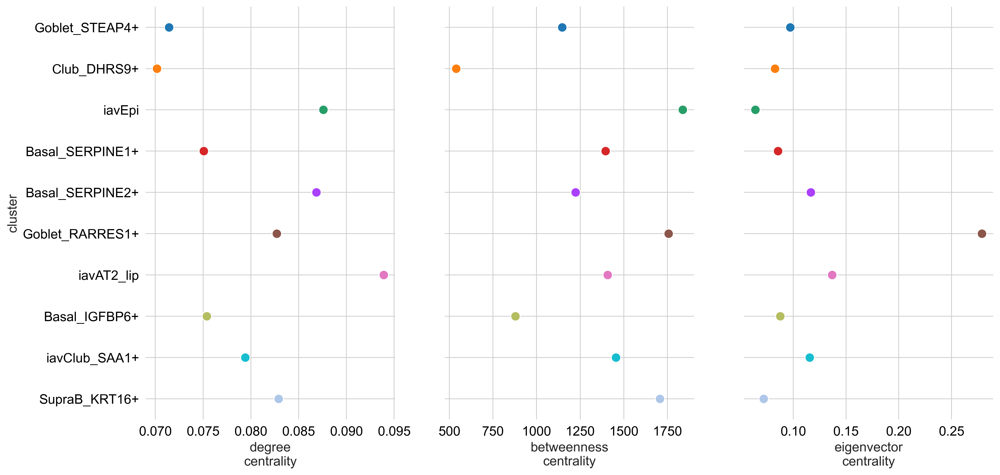

In [50]:
links.plot_score_per_cluster(goi="NFIC")

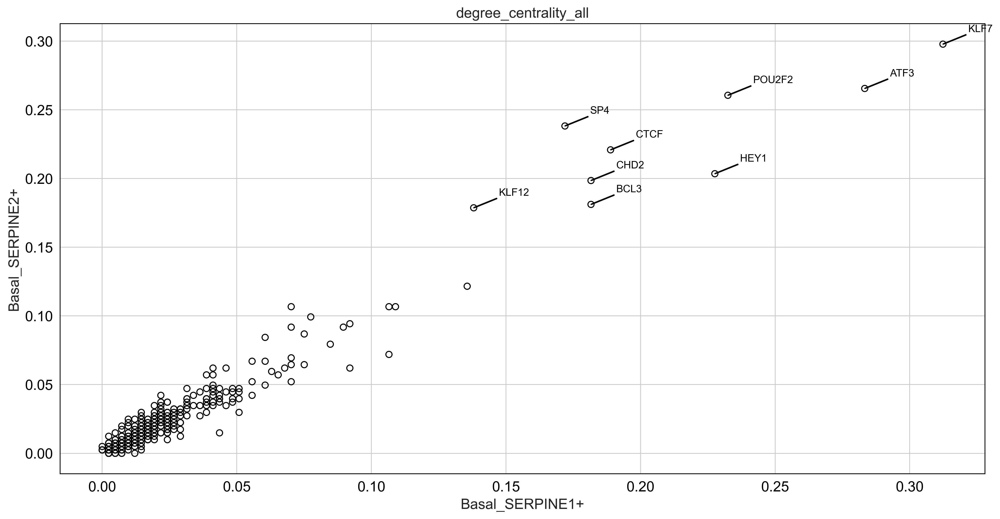

In [51]:
links.plot_score_comparison_2D(value = "degree_centrality_all",
                               cluster1 = "Basal_SERPINE1+", cluster2 = "Basal_SERPINE2+",
                               percentile = 98, save = f"{save_folder}/score_comparison")

KLF7


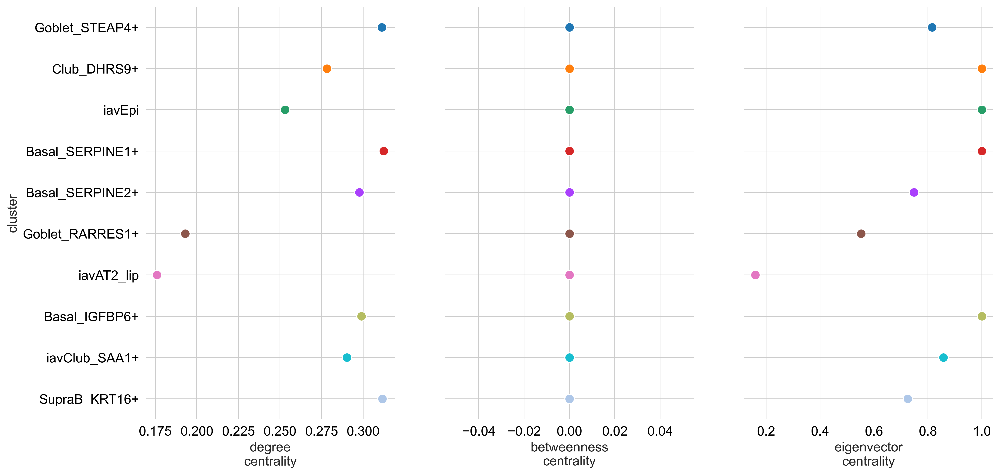

In [52]:
links.plot_score_per_cluster(goi="KLF7")

KLF7


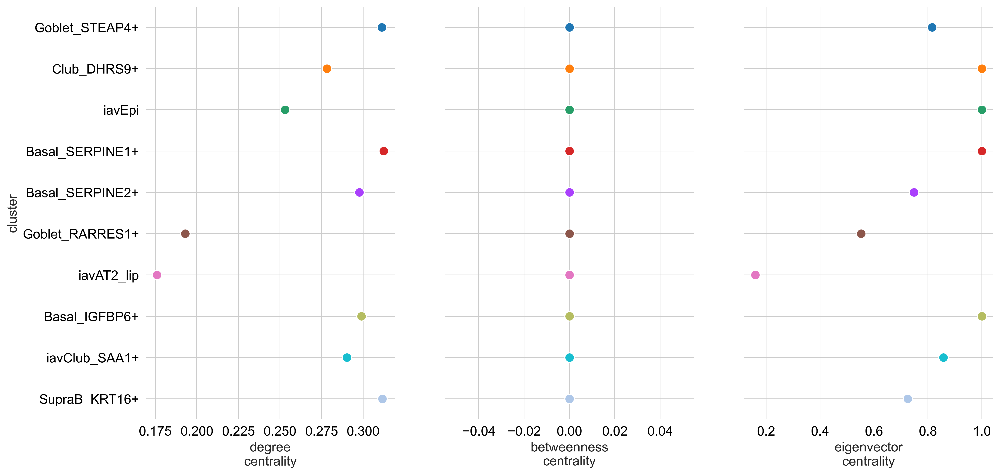

In [53]:
links.plot_score_per_cluster(goi = "KLF7", save = f"{save_folder}/network_score_per_gene/")

In [54]:
cluster_name = "Basal_SERPINE1+"
filtered_links_df = links.filtered_links[cluster_name]
filtered_links_df.head()

,source,target,coef_mean,coef_abs,p,-logp
2142,IRF7,IDO1,0.850036,0.850036,1.309683e-14,13.882834
3987,CREB3L1,SAA1,0.731325,0.731325,2.115390e-13,12.674610
1372,KLF7,DST,0.718100,0.718100,2.983267e-20,19.525308
4483,KLF7,TAGLN,0.701655,0.701655,3.540669e-16,15.450915
4017,AHR,SCD,0.642023,0.642023,9.699004e-19,18.013273


In [63]:
cluster_name = "Basal_SERPINE2+"
filtered_links_df = links.filtered_links[cluster_name]
filtered_links_df_sig = filtered_links_df[filtered_links_df['-logp'] > 10]
filtered_links_df_sig.head()

,source,target,coef_mean,coef_abs,p,-logp
1250,IRF7,DDX58,0.796857,0.796857,3.753246e-12,11.425593
1860,ATF3,GNB4,0.531903,0.531903,4.849146e-13,12.314335
3009,SP4,MX1,-0.415554,0.415554,1.154001e-16,15.937794
4530,IRF7,THBS1,0.413376,0.413376,6.501922e-18,17.186958
2940,POU2F2,MMP9,0.400568,0.400568,2.195219e-21,20.658522


In [64]:
grouped = filtered_links_df.groupby('source')['target'].apply(list)

# Print the groups and their associated targets
for source, targets in grouped.items():
    print(f"Source: {source}")
    print(f"Targets: {targets}")
    print()  # Add an empty line for readability

Source: AHR
Targets: ['SCD', 'FOXQ1', 'ADK', 'NFIC', 'PSIP1', 'NOL6', 'PNPLA2', 'PFKL', 'PEG10', 'MAGI1', 'LRG1', 'ALOX15', 'RINT1', 'GLIPR2', 'IFT74', 'OXCT1']

Source: AR
Targets: ['SAA1', 'RALGAPA2', 'CXXC5', 'SCNN1A', 'HMGCS1', 'SNAI2', 'VTCN1', 'NREP', 'MICU1', 'DDIT3', 'PNPLA2', 'GSDMD', 'ANKH', 'PIP', 'ZNF391', 'ECI2', 'COLCA2', 'SGK1', 'SCARB1', 'FNDC3A', 'SLC22A23']

Source: ATF3
Targets: ['DDX58', 'GNB4', 'MX1', 'IRF7', 'DDIT4', 'THBS1', 'EDN1', 'KRT17', 'P3H2', 'PDZK1IP1', 'CD274', 'NT5E', 'AQP3', 'BIRC3', 'SPTBN1', 'AKAP12', 'VEGFA', 'TAGLN', 'TUBA1A', 'TUBB2A', 'DAB2', 'GMPR', 'CMTM3', 'CDH6', 'CDKN2B', 'SCNN1A', 'SCGB3A1', 'CDKN1A', 'CXCL6', 'GPR158', 'SGK1', 'STX8', 'SPAST', 'GSDMD', 'CD59', 'ANKH', 'PGF', 'MYO10', 'TNFRSF12A', 'FADS3', 'HBEGF', 'BCAS3', 'EHF', 'IL6R', 'MAL2', 'RAPGEF2', 'PNPLA2', 'APOE', 'GMDS', 'BCAM', 'PDE4D', 'C1QTNF1', 'SLC44A4', 'NEDD9', 'PDZD2', 'DOP1B', 'KAT6A', 'SRRM1', 'PLCE1', 'MAGI1', 'SERPINB9', 'GALM', 'BET1L', 'GLIS3', 'SLC43A2', 'LIMCH1',

In [65]:
# Convert the grouped data into a DataFrame
result_df = grouped.reset_index(name = 'targets')
result_df.head()

,source,targets
0,AHR,"[SCD, FOXQ1, ADK, NFIC, PSIP1, NOL6, PNPLA2, P..."
1,AR,"[SAA1, RALGAPA2, CXXC5, SCNN1A, HMGCS1, SNAI2,..."
2,ATF3,"[DDX58, GNB4, MX1, IRF7, DDIT4, THBS1, EDN1, K..."
3,BACH1,"[DST, AKAP12, SOX15, RAB31, LFNG, TUBB6, TNFRS..."
4,BCL11B,"[IDO1, CD274, SGK1, PRKCD, MCM3, IFNL1]"


In [68]:
filtered_df = result_df[result_df['source'] == 'KLF7']
targets = filtered_df['targets'].tolist()

In [76]:
print(targets)

[['COL7A1', 'DST', 'TINAGL1', 'SERPING1', 'TAGLN', 'MX1', 'NT5E', 'SLC20A1', 'CA12', 'IGFBP2', 'CAPG', 'MYADM', 'CAV2', 'AKAP12', 'TUBB6', 'DDIT4', 'CDKN1A', 'NEDD9', 'CD59', 'KLF10', 'S100A9', 'TUBB2A', 'BASP1', 'RAB31', 'LFNG', 'AQP3', 'PGF', 'DSP', 'IRF7', 'SGK1', 'SCNN1A', 'MICU1', 'GLTP', 'NCOA7', 'TSHZ2', 'CTSC', 'CRIP2', 'PRKAR2A', 'BCAM', 'ANKH', 'MAL2', 'FKRP', 'TPM2', 'MYO10', 'KATNA1', 'BIRC3', 'SLC44A4', 'SRRM1', 'MSC-AS1', 'SLC22A23', 'TNFRSF12A', 'HAS3', 'HBEGF', 'C1QTNF1', 'CDKN2B', 'FADS3', 'FEZ1', 'NR1D1', 'NIPBL', 'HMGCS1', 'BET1L', 'SERPINB1', 'ADK', 'APOE', 'PFKL', 'ALOX15', 'DOP1B', 'GSDMD', 'LOXL1', 'KAT6A', 'PRKCD', 'PLIN2', 'DDIT3', 'FUT3', 'DCAF15', 'GMNN', 'CRLF1', 'PSIP1', 'ALDH1B1', 'PEG10', 'MN1', 'AQP5', 'ANKRD65', 'LAMA1', 'MAGI1', 'PNPLA2', 'KCNMB4', 'TMEM164', 'BHLHE41', 'BCAS3', 'GMPR', 'CDC25B', 'SLC30A4', 'CLCF1', 'PPP1R15B', 'GMDS', 'MFSD12', 'C11orf96', 'CSF2', 'HSD17B14', 'LRG1', 'NFIC', 'PDZD2', 'SLC25A23', 'ECI2', 'RNF38', 'SMAD9', 'PDE4D', 'ARR

In [82]:
markers = ['COL7A1', 'DST', 'TINAGL1', 'SERPING1', 'TAGLN', 'NT5E', 'SLC20A1', 'CA12', 'IGFBP2', 'CAPG', 'MYADM', 'AKAP12', 'TUBB6', 'DDIT4', 'CDKN1A', 'NEDD9', 'CD59', 'KLF10', 'S100A9', 'TUBB2A', 'BASP1', 'RAB31', 'LFNG', 'PGF', 'DSP', 'IRF7', 'SGK1', 'SCNN1A', 'MICU1', 'GLTP', 'NCOA7', 'TSHZ2', 'CTSC', 'CRIP2', 'PRKAR2A', 'BCAM', 'ANKH', 'MAL2', 'FKRP', 'TPM2', 'MYO10', 'KATNA1', 'BIRC3', 'SLC44A4', 'SRRM1', 'MSC-AS1', 'SLC22A23', 'TNFRSF12A', 'HAS3', 'HBEGF', 'C1QTNF1', 'CDKN2B', 'FADS3', 'FEZ1', 'NR1D1', 'NIPBL', 'HMGCS1', 'BET1L', 'SERPINB1', 'ADK', 'APOE', 'PFKL', 'ALOX15', 'DOP1B', 'GSDMD', 'LOXL1', 'KAT6A', 'PRKCD', 'PLIN2', 'DDIT3', 'FUT3', 'DCAF15', 'GMNN', 'CRLF1', 'PSIP1', 'ALDH1B1', 'PEG10', 'MN1', 'AQP5', 'ANKRD65', 'LAMA1', 'MAGI1', 'PNPLA2', 'KCNMB4', 'TMEM164', 'BHLHE41', 'BCAS3', 'GMPR', 'CDC25B', 'SLC30A4', 'CLCF1', 'PPP1R15B', 'GMDS', 'MFSD12', 'C11orf96', 'CSF2', 'HSD17B14', 'LRG1', 'NFIC', 'PDZD2', 'SLC25A23', 'ECI2', 'RNF38', 'SMAD9', 'PDE4D', 'ARRB2', 'IFT74', 'SMAD6', 'NOL6', 'SCARB1', 'SLC43A2', 'PALM', 'CACTIN', 'ALDH5A1', 'RANBP9', 'FBLN2', 'SPRY2']

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50


    finished (0:00:01)
Storing dendrogram info using `.uns['dendrogram_mixed_states']`


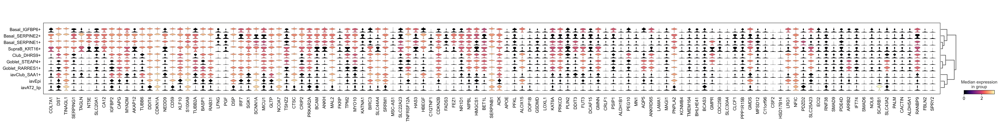

In [86]:
sc.pl.stacked_violin(adata_log, markers, groupby = 'mixed_states', layer = 'sqrt_norm', cmap = 'magma', dendrogram = True)

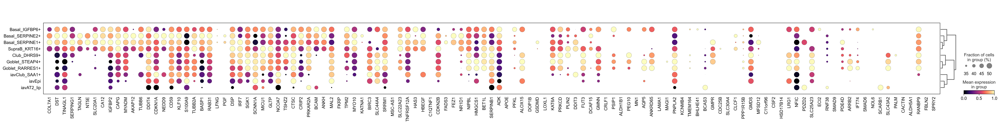

In [88]:
sc.pl.dotplot(adata_log, markers, groupby='mixed_states', dendrogram=True, dot_max=0.5, dot_min=0.3, standard_scale='var', layer = 'sqrt_norm', cmap = 'magma')